
# **YOLOv8.2-segment**

Это руководство основано на [репозитории ultralytics](ultralytics).
  
Тип разметки для YOLO - набор точек объектов
# **YOLOv8.2-segment**

本指南基于[ultralytics](ultralytics)。

YOLO 的标记类型 - 一组轮廓点

# **1. Установка зависимостей**
# **1. 安装依赖项**

# 1.1 Монтирование Google Drive  
Можно не монтировать гугл диск, а хранить все данные для выполнения дз в файлах ноутбука, но тогда репозиторий YOLO, результаты обучения и датасет не сохранятся при отключении от среды выполнения. То есть каждый раз надо будет клонировать репозиторий и загружать датасет, что не очень удобно.
# 1.1 加载Google Drive
您可以不挂载Google驱动器，而是将执行任务的所有数据存储在笔记本电脑文件中，但是当与运行时环境断开连接时，YOLO存储库、训练结果和数据集将不会被保存。也就是说，每次都需要克隆存储库并下载数据集，这不是很方便。

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


## Определяем видеокарту GPU, чтобы на ней учить нейронную сеть
## 确定 GPU 显卡以便在其上训练神经网络

In [2]:
!nvidia-smi

Sun May 24 01:23:45 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   33C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# 1.2 Установка зависимостей
# 1.2 安装依赖

In [3]:
%pip install ultralytics
import ultralytics
import os
import json
import shutil
import yaml
from sklearn.model_selection import train_test_split
ultralytics.checks()

Ultralytics 8.4.53 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 47.3/112.6 GB disk)


# **2. Импорт датасета**
#**2.导入数据集**

Набор данных должен быть экспортирован из cvat в формате COCO 1.0.  

В бесплатной онлайн-версии нельзя экспортировать датасет вместе с картинками, если используется эта версия, картинки надо загружать отдельно. Если устанавливать cvat локально, такого ограничения нет.

Загрузите аннотации и картинки в одну папку и загрузите ее на google диск,туда же поместите файл instances_default.json.

数据集必须以 COCO 1.0 格式从 cvat 导出。

在免费在线版本中，您无法将数据集与图片一起导出；如果您使用此版本，则必须单独上传图片。如果本地安装cvat则没有这样的限制。

将注释和图片上传到一个文件夹中，然后将其上传到Google Drive，将instances_default.json 文件也放在那里。

In [4]:
def convert_coco_to_yolo_segmentation(json_file, folder_name = "labels"):
    folder_name = folder_name
    # Load the JSON file
    with open(json_file, 'r') as file:
        coco_data = json.load(file)

    # Create a "labels" folder to store YOLO segmentation annotations
    output_folder = os.path.join(os.path.dirname(json_file), folder_name)
    os.makedirs(output_folder, exist_ok=True)

    # Extract annotations from the COCO JSON data
    annotations = coco_data['annotations']
    for annotation in annotations:
        image_id = annotation['image_id']
        category_id = annotation['category_id']
        segmentation = annotation['segmentation']
        bbox = annotation['bbox']

        # Find the image filename from the COCO data
        for image in coco_data['images']:
            if image['id'] == image_id:
                image_filename = os.path.basename(image['file_name'])
                image_filename = os.path.splitext(image_filename)[0] # Removing the extension. (In our case, it is the .jpg or .png part.)
                image_width = image['width']
                image_height = image['height']
                break

        # Calculate the normalized center coordinates and width/height
        x_center = (bbox[0] + bbox[2] / 2) / image_width
        y_center = (bbox[1] + bbox[3] / 2) / image_height
        bbox_width = bbox[2] / image_width
        bbox_height = bbox[3] / image_height

        # Convert COCO segmentation to YOLO segmentation format
        yolo_segmentation = [f"{(x) / image_width:.5f} {(y) / image_height:.5f}" for x, y in zip(segmentation[0][::2], segmentation[0][1::2])]
        #yolo_segmentation.append(f"{(segmentation[0][0]) / image_width:.5f} {(segmentation[0][1]) / image_height:.5f}")
        yolo_segmentation = ' '.join(yolo_segmentation)

        # Generate the YOLO segmentation annotation line
        yolo_annotation = f"{category_id} {yolo_segmentation}"

        # Save the YOLO segmentation annotation in a file
        output_filename = os.path.join(output_folder, f"{image_filename}.txt")
        with open(output_filename, 'a+') as file:
            file.write(yolo_annotation + '\n')

    print("Conversion completed. YOLO segmentation annotations saved in 'labels' folder.")

# Example usage
json_file = "/content/gdrive/MyDrive/ds/annotations/instances_default.json" #JSON file
split = "/content/gdrive/MyDrive/ds/images/default" #Folder
convert_coco_to_yolo_segmentation(json_file, split)

Conversion completed. YOLO segmentation annotations saved in 'labels' folder.


In [5]:
dataset_path = '/content/gdrive/MyDrive/ds/images/default' # Укажите свой путь до датасета

In [6]:
test_size = 0.2 # размер тестовой выборки
valid_size = 0.1 # размер валидационной выборки

In [ ]:
import json
with open(json_file) as f:
    coco = json.load(f)
print(coco['categories'])

[{'id': 1, 'name': 'blackberry', 'supercategory': ''}, {'id': 2, 'name': 'raspberry', 'supercategory': ''}, {'id': 3, 'name': 'strawberry', 'supercategory': ''}]


In [7]:
image_files = [f for f in os.listdir(dataset_path) if f.endswith('.jpg')]
annotation_files = [f for f in os.listdir(dataset_path) if f.endswith('.txt')]

image_files_with_annotations = [f for f in image_files if f.replace('.jpg', '.txt') in annotation_files]

train_files, test_files = train_test_split(image_files_with_annotations, test_size=test_size, random_state=42)
train_files, valid_files = train_test_split(train_files, test_size=len(image_files_with_annotations)*valid_size/len(train_files), random_state=42)

def copy_files(files, source_path, dest_path, folder):
    for file in files:
        shutil.copy(os.path.join(source_path, file), os.path.join(dest_path, 'images', folder))
        shutil.copy(os.path.join(source_path, file.replace('.jpg', '.txt')), os.path.join(dest_path, 'labels', folder))

for folder in ['train', 'val', 'test']:
    os.makedirs(os.path.join(dataset_path, 'images', folder), exist_ok=True)
    os.makedirs(os.path.join(dataset_path, 'labels', folder), exist_ok=True)

copy_files(train_files, dataset_path, dataset_path, 'train')
copy_files(valid_files, dataset_path, dataset_path, 'val')
copy_files(test_files, dataset_path, dataset_path, 'test')

for file in os.listdir(dataset_path):
    if not file.endswith('.names') and os.path.isfile(os.path.join(dataset_path, file)):
      os.remove(os.path.join(dataset_path, file))

In [8]:
train_path = f'{dataset_path}/images/train'
val_path = f'{dataset_path}/images/val'
test_path = f'{dataset_path}/images/test'

# names_file = os.path.join(dataset_path, 'obj.names')
# with open(names_file, 'r') as file:
#     class_names = [line.strip() for line in file.readlines()]

# num_classes = len(class_names)

# data = {
#     'path': dataset_path,
#     'train': train_path,
#     'val': val_path,
#     'test': test_path,
#     'names': {
#         0: 'None',
#         1: 'blackberry',
#         2: 'raspberry',
#         3: 'strawberry'
#     }
# }

data = {
    'path': dataset_path,
    'train': 'images/train',
    'val': 'images/val',
    'test': 'images/test',
    'nc': 4,
    'names': {0: 'None', 1: 'blackberry', 2: 'raspberry', 3: 'strawberry'}
}

# data = {
#     'path': '/content/gdrive/MyDrive/ds/images/default',
#     'train': '/content/gdrive/MyDrive/ds/images/default/images/train',
#     'val':   '/content/gdrive/MyDrive/ds/images/default/images/val',
#     'test':  '/content/gdrive/MyDrive/ds/images/default/images/test',
#     'nc': 3,
#     'names': {0: 'blackberry', 1: 'raspberry', 2: 'strawberry'}
# }

output_file = os.path.join(dataset_path, 'data.yaml')
with open(output_file, 'w') as file:
    documents = yaml.dump(data, file)

# os.remove(os.path.join(dataset_path, 'obj.names'))

# **3. Запуск обучения**
#**3.开始训练**

In [9]:
%cd /content/gdrive/MyDrive

/content/gdrive/MyDrive


# 3.1 Начало обучения

[Чтобы получить полный список аргументов обучения, перейдите по ссылке](https://docs.ultralytics.com/modes/train/#train-settings)

#3.1 训练开始

[有关训练参数的完整列表，请点击链接](https://docs.ultralytics.com/modes/train/#train-settings)

In [10]:
# Load YOLOv8n-seg, train it on COCO128-seg for 3 epochs and predict an image with it
from ultralytics import YOLO

model1 = YOLO('yolov8n-seg.pt')  # load a pretrained YOLOv8n segmentation model
model1.train(data='ds/images/default/data.yaml', epochs=10, imgsz=640, device=0)  # train the model
# model('datasets_seg/images/train/airplane(0).jpeg')  # predict on an image

Ultralytics 8.4.53 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=ds/images/default/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, 

ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79714c4eec30>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.04

Результаты сохранены в: /content/gdrive/MyDrive/runs/segment/train


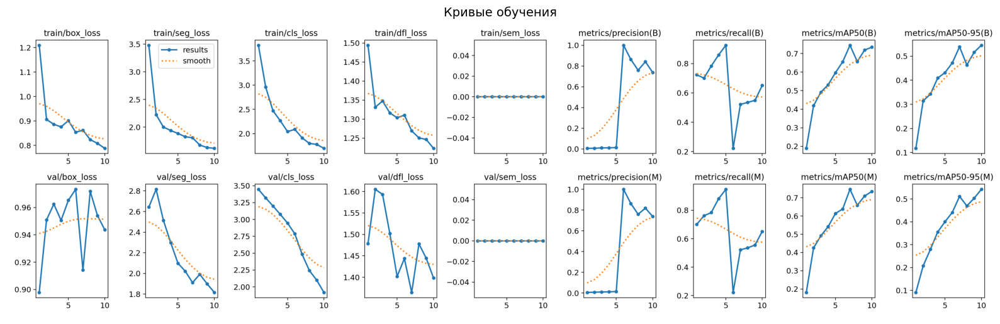

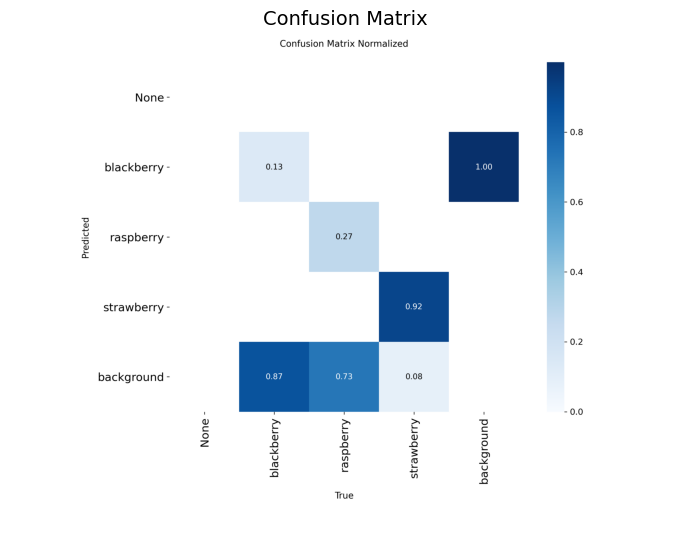

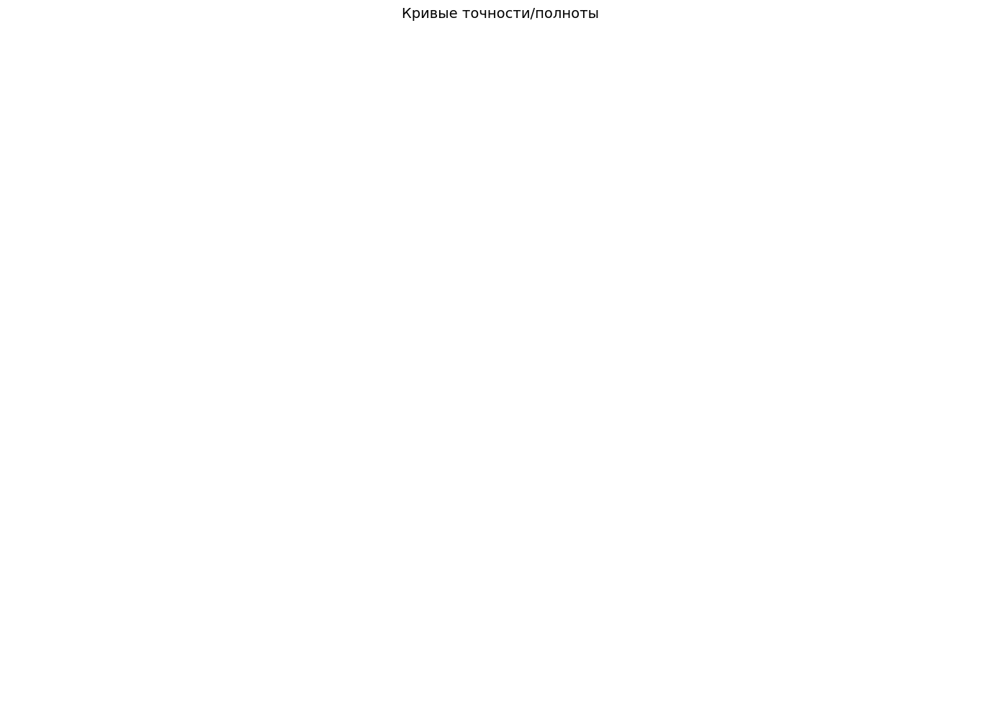

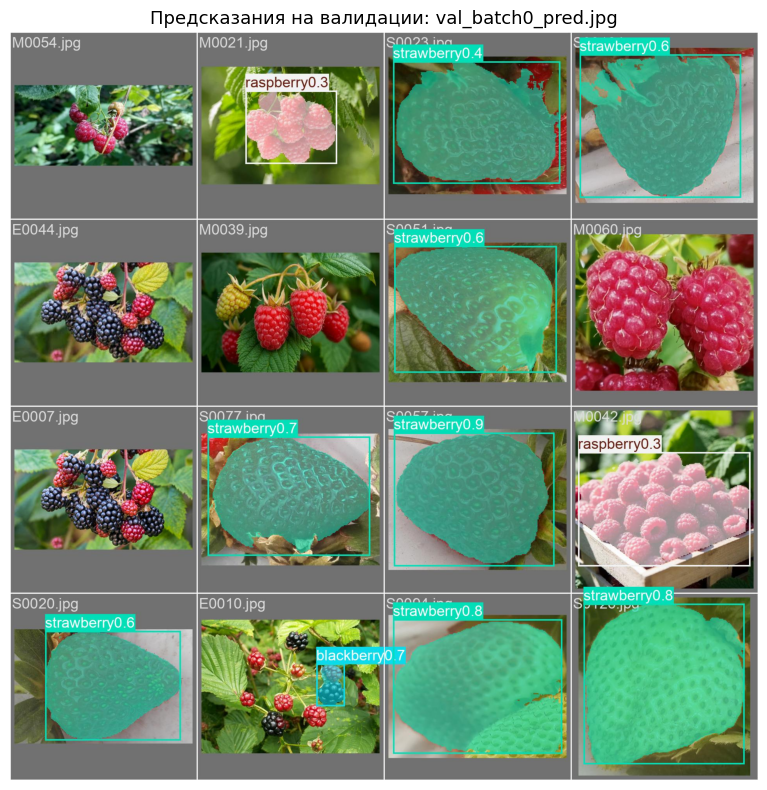


📊 Итоговые метрики (val):
  mAP50:    0.7344
  mAP50-95: 0.5427
  Precision:0.7386
  Recall:   0.6510


In [11]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Папка с результатами обучения
train_dir = model1.trainer.save_dir  # берём автоматически из последнего запуска
# или укажи вручную: train_dir = 'runs/segment/train'

print(f"Результаты сохранены в: {train_dir}")

# --- 1. Кривые обучения (loss + метрики по эпохам) ---
results_png = os.path.join(train_dir, 'results.png')
if os.path.exists(results_png):
    plt.figure(figsize=(16, 8))
    plt.imshow(mpimg.imread(results_png))
    plt.axis('off')
    plt.title('Кривые обучения', fontsize=14)
    plt.tight_layout()
    plt.show()

# --- 2. Матрица ошибок ---
for cm_file in ['confusion_matrix_normalized.png', 'confusion_matrix.png']:
    cm_path = os.path.join(train_dir, cm_file)
    if os.path.exists(cm_path):
        plt.figure(figsize=(7, 6))
        plt.imshow(mpimg.imread(cm_path))
        plt.axis('off')
        plt.title('Confusion Matrix', fontsize=14)
        plt.tight_layout()
        plt.show()
        break

# --- 3. PR / F1 / P / R кривые ---
curves = {
    'PR Curve': 'PR_curve.png',
    'F1 Curve': 'F1_curve.png',
    'Precision Curve': 'P_curve.png',
    'Recall Curve': 'R_curve.png',
}
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
for ax, (title, fname) in zip(axes.flatten(), curves.items()):
    fpath = os.path.join(train_dir, fname)
    if os.path.exists(fpath):
        ax.imshow(mpimg.imread(fpath))
        ax.set_title(title, fontsize=12)
    ax.axis('off')
plt.suptitle('Кривые точности/полноты', fontsize=14)
plt.tight_layout()
plt.show()

# --- 4. Примеры предсказаний на валидации ---
for fname in ['val_batch0_pred.jpg', 'val_batch1_pred.jpg']:
    fpath = os.path.join(train_dir, fname)
    if os.path.exists(fpath):
        plt.figure(figsize=(14, 8))
        plt.imshow(mpimg.imread(fpath))
        plt.axis('off')
        plt.title(f'Предсказания на валидации: {fname}', fontsize=13)
        plt.tight_layout()
        plt.show()

# --- 5. Итоговые метрики числами ---
metrics = model1.trainer.metrics  # или model1.val() если хочешь пересчитать
print("\n📊 Итоговые метрики (val):")
print(f"  mAP50:    {metrics.get('metrics/mAP50(M)', 'N/A'):.4f}")
print(f"  mAP50-95: {metrics.get('metrics/mAP50-95(M)', 'N/A'):.4f}")
print(f"  Precision:{metrics.get('metrics/precision(M)', 'N/A'):.4f}")
print(f"  Recall:   {metrics.get('metrics/recall(M)', 'N/A'):.4f}")

In [13]:
from ultralytics import YOLO

model2 = YOLO('yolov8s-seg.pt')  # s вместо n — чуть мощнее

model2.train(
    data='ds/images/default/data.yaml',
    epochs=100,
    imgsz=640,
    device=0,
    patience=20,          # early stopping если нет улучшений 20 эпох
    batch=16,
    # Аугментации — помогают при малом датасете
    hsv_h=0.015,
    hsv_s=0.7,
    hsv_v=0.4,
    fliplr=0.5,
    flipud=0.1,
    mosaic=1.0,
    mixup=0.1,
    degrees=10.0,
    translate=0.1,
    scale=0.5,
    name='train_v2'
)

Ultralytics 8.4.53 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=ds/images/default/data.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.1, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=yolov8s-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train_v2-2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patienc

ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x797068184b30>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.04

Результаты сохранены в: /content/gdrive/MyDrive/runs/segment/train_v2-2


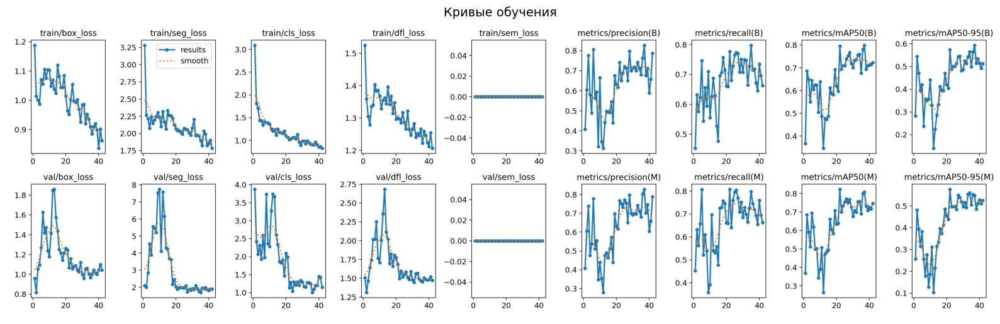

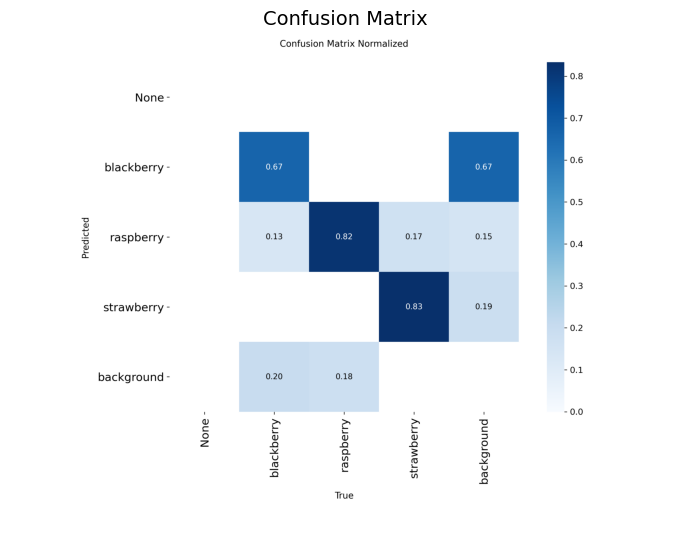

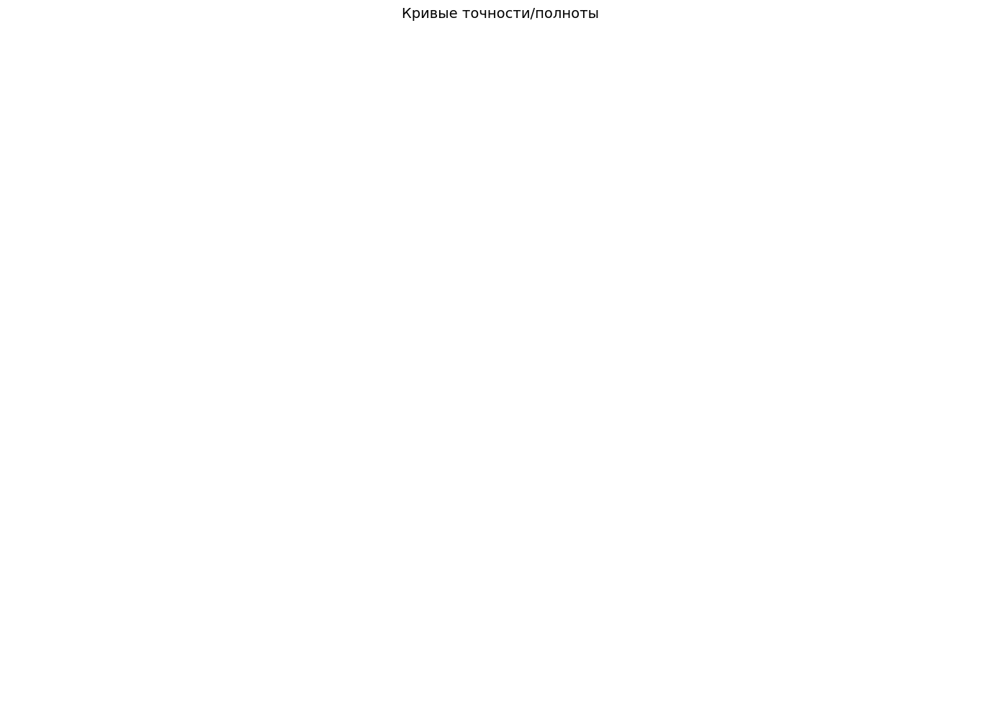

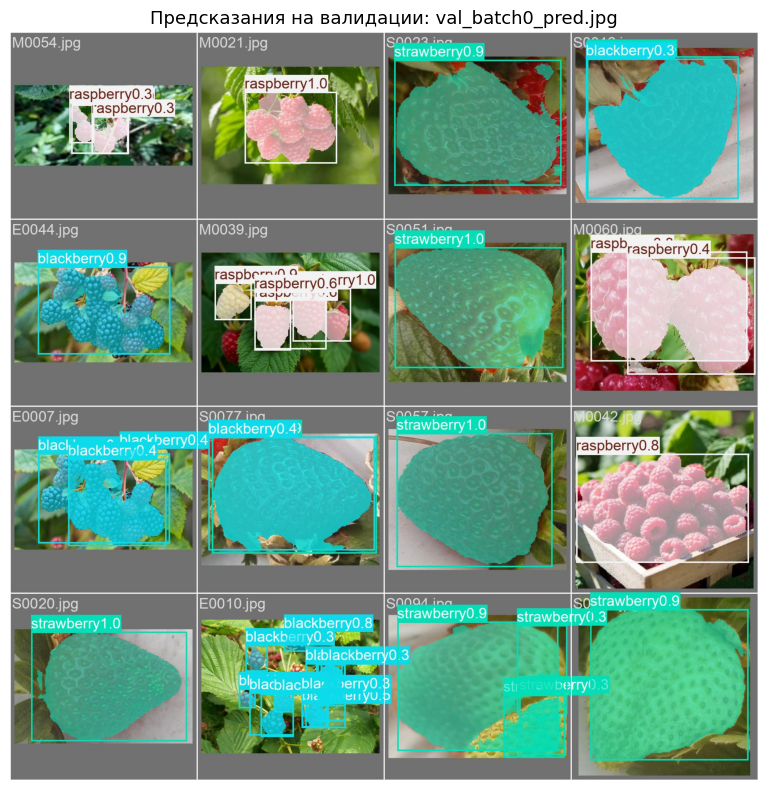


📊 Итоговые метрики (val):
  mAP50:    0.7344
  mAP50-95: 0.5427
  Precision:0.7386
  Recall:   0.6510


In [15]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Папка с результатами обучения
train_dir = model2.trainer.save_dir  # берём автоматически из последнего запуска
# или укажи вручную: train_dir = 'runs/segment/train'

print(f"Результаты сохранены в: {train_dir}")

# --- 1. Кривые обучения (loss + метрики по эпохам) ---
results_png = os.path.join(train_dir, 'results.png')
if os.path.exists(results_png):
    plt.figure(figsize=(16, 8))
    plt.imshow(mpimg.imread(results_png))
    plt.axis('off')
    plt.title('Кривые обучения', fontsize=14)
    plt.tight_layout()
    plt.show()

# --- 2. Матрица ошибок ---
for cm_file in ['confusion_matrix_normalized.png', 'confusion_matrix.png']:
    cm_path = os.path.join(train_dir, cm_file)
    if os.path.exists(cm_path):
        plt.figure(figsize=(7, 6))
        plt.imshow(mpimg.imread(cm_path))
        plt.axis('off')
        plt.title('Confusion Matrix', fontsize=14)
        plt.tight_layout()
        plt.show()
        break

# --- 3. PR / F1 / P / R кривые ---
curves = {
    'PR Curve': 'PR_curve.png',
    'F1 Curve': 'F1_curve.png',
    'Precision Curve': 'P_curve.png',
    'Recall Curve': 'R_curve.png',
}
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
for ax, (title, fname) in zip(axes.flatten(), curves.items()):
    fpath = os.path.join(train_dir, fname)
    if os.path.exists(fpath):
        ax.imshow(mpimg.imread(fpath))
        ax.set_title(title, fontsize=12)
    ax.axis('off')
plt.suptitle('Кривые точности/полноты', fontsize=14)
plt.tight_layout()
plt.show()

# --- 4. Примеры предсказаний на валидации ---
for fname in ['val_batch0_pred.jpg', 'val_batch1_pred.jpg']:
    fpath = os.path.join(train_dir, fname)
    if os.path.exists(fpath):
        plt.figure(figsize=(14, 8))
        plt.imshow(mpimg.imread(fpath))
        plt.axis('off')
        plt.title(f'Предсказания на валидации: {fname}', fontsize=13)
        plt.tight_layout()
        plt.show()

# --- 5. Итоговые метрики числами ---
metrics = model1.trainer.metrics  # или model1.val() если хочешь пересчитать
print("\n📊 Итоговые метрики (val):")
print(f"  mAP50:    {metrics.get('metrics/mAP50(M)', 'N/A'):.4f}")
print(f"  mAP50-95: {metrics.get('metrics/mAP50-95(M)', 'N/A'):.4f}")
print(f"  Precision:{metrics.get('metrics/precision(M)', 'N/A'):.4f}")
print(f"  Recall:   {metrics.get('metrics/recall(M)', 'N/A'):.4f}")

In [18]:
with open('/content/gdrive/MyDrive/ds/images/default/data.yaml') as f:
    print(f.read())

names:
  0: None
  1: blackberry
  2: raspberry
  3: strawberry
nc: 4
path: /content/gdrive/MyDrive/ds/images/default
test: images/test
train: images/train
val: images/val



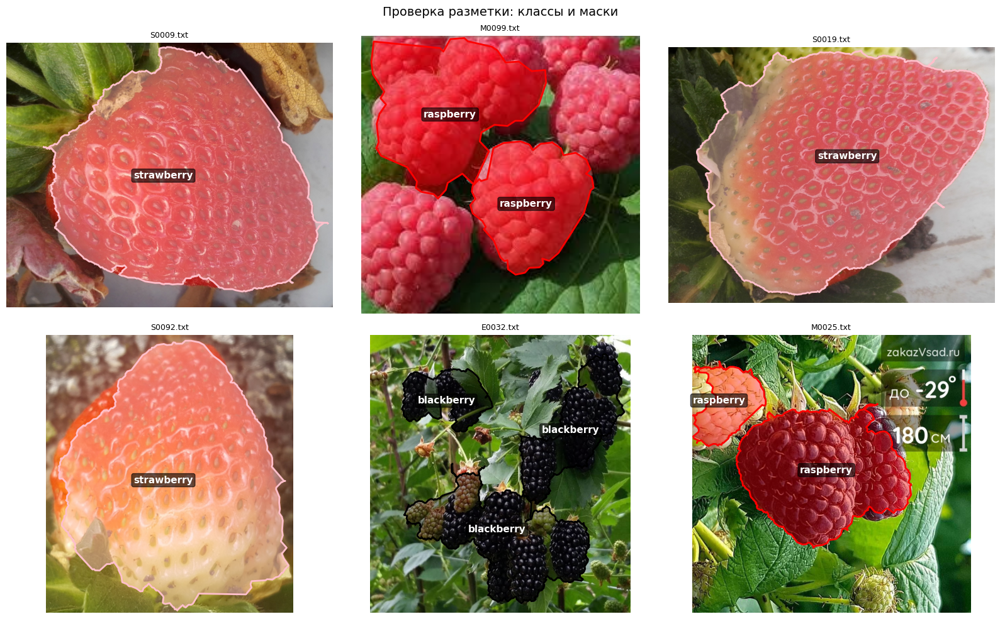

In [20]:
import os, random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import numpy as np

# Укажи свои пути и имена классов
labels_root = '/content/gdrive/MyDrive/ds/images/default/labels/train'
images_root = '/content/gdrive/MyDrive/ds/images/default/images/train'
class_names = {0: 'None', 1: 'blackberry', 2: 'raspberry', 3: 'strawberry'}  # текущие
colors = {0: 'gray', 1: 'black', 2: 'red', 3: 'pink'}

# Берём 6 случайных изображений
files = [f for f in os.listdir(labels_root) if f.endswith('.txt')]
sample = random.sample(files, min(6, len(files)))

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
for ax, label_file in zip(axes.flatten(), sample):
    img_name = label_file.replace('.txt', '.jpg')
    img_path = os.path.join(images_root, img_name)
    if not os.path.exists(img_path):
        img_name = label_file.replace('.txt', '.jpeg')
        img_path = os.path.join(images_root, img_name)

    img = np.array(Image.open(img_path))
    h, w = img.shape[:2]
    ax.imshow(img)

    with open(os.path.join(labels_root, label_file)) as f:
        for line in f:
            parts = line.strip().split()
            class_id = int(parts[0])
            coords = list(map(float, parts[1:]))
            # Рисуем полигон маски
            xs = [c * w for c in coords[0::2]]
            ys = [c * h for c in coords[1::2]]
            ax.fill(xs, ys, alpha=0.4, color=colors.get(class_id, 'white'))
            ax.plot(xs + [xs[0]], ys + [ys[0]], color=colors.get(class_id, 'white'), lw=2)
            # Подпись класса
            ax.text(np.mean(xs), np.mean(ys),
                    class_names.get(class_id, str(class_id)),
                    color='white', fontsize=11, fontweight='bold',
                    ha='center', va='center',
                    bbox=dict(boxstyle='round,pad=0.2', facecolor='black', alpha=0.6))

    ax.set_title(label_file, fontsize=9)
    ax.axis('off')

plt.suptitle('Проверка разметки: классы и маски', fontsize=14)
plt.tight_layout()
plt.show()

In [21]:
from ultralytics import YOLO

model3 = YOLO('yolov8s-seg.pt')

model3.train(
    data='/content/gdrive/MyDrive/ds/images/default/data.yaml',
    epochs=150,
    imgsz=640,
    device=0,
    patience=30,          # было 20 — best был на 22, дадим больше времени
    batch=16,
    cache=True,           # кэш изображений в RAM — быстрее в разы
    cos_lr=True,          # косинусный lr — лучше сходится
    # Аугментации
    hsv_h=0.015,
    hsv_s=0.7,
    hsv_v=0.4,
    fliplr=0.5,
    flipud=0.1,
    mosaic=1.0,
    mixup=0.1,
    copy_paste=0.3,       # новое — хорошо для сегментации
    degrees=15.0,
    translate=0.1,
    scale=0.5,
    name='train_v3'
)

Ultralytics 8.4.53 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.3, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/gdrive/MyDrive/ds/images/default/data.yaml, degrees=15.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=150, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.1, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=yolov8s-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train_v3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overla

ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79714fe1c860>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.04

Результаты сохранены в: /content/gdrive/MyDrive/runs/segment/train_v3


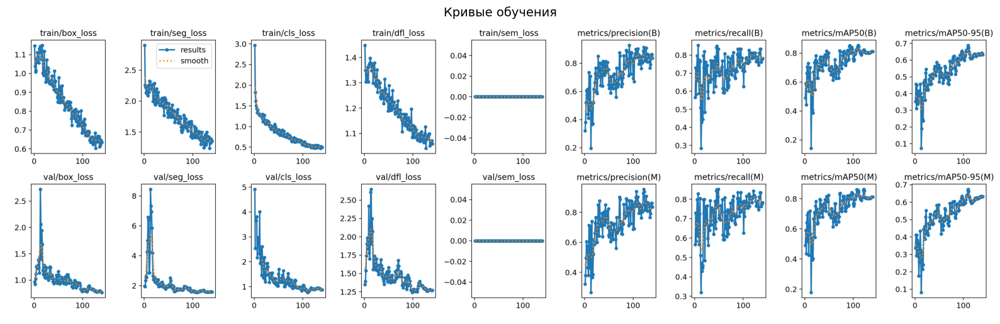

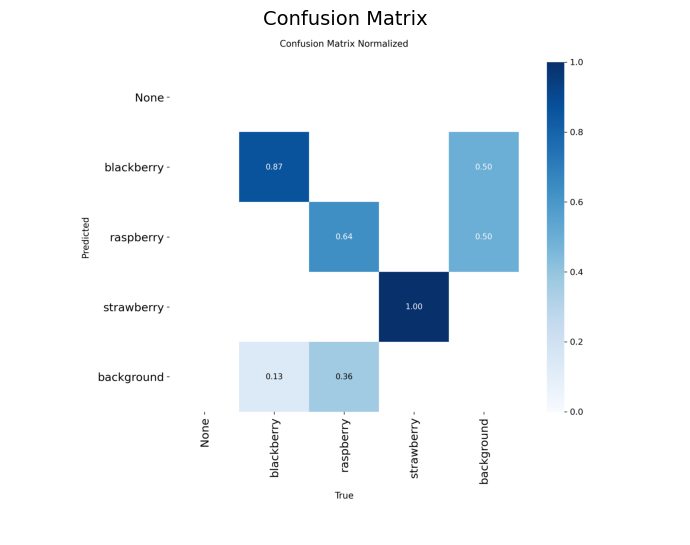

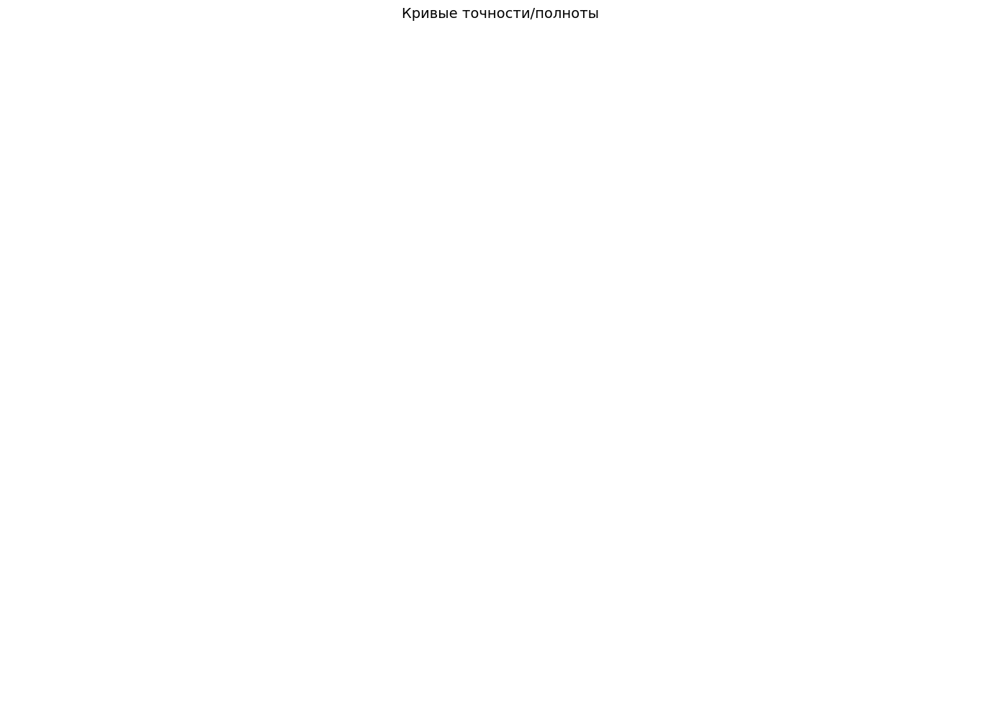

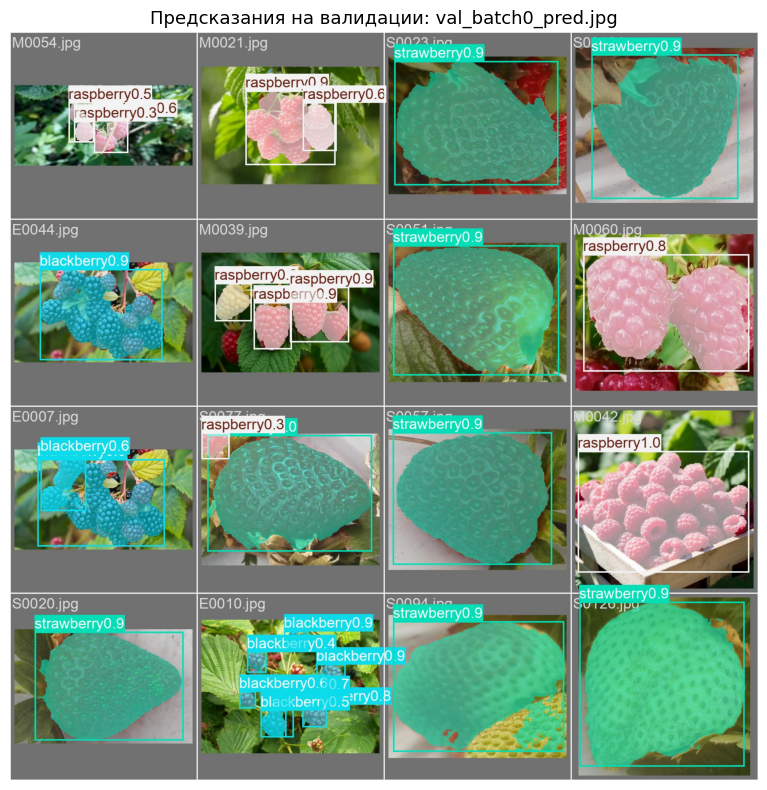


📊 Итоговые метрики (val):
  mAP50:    0.7344
  mAP50-95: 0.5427
  Precision:0.7386
  Recall:   0.6510


In [22]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Папка с результатами обучения
train_dir = model3.trainer.save_dir  # берём автоматически из последнего запуска
# или укажи вручную: train_dir = 'runs/segment/train'

print(f"Результаты сохранены в: {train_dir}")

# --- 1. Кривые обучения (loss + метрики по эпохам) ---
results_png = os.path.join(train_dir, 'results.png')
if os.path.exists(results_png):
    plt.figure(figsize=(16, 8))
    plt.imshow(mpimg.imread(results_png))
    plt.axis('off')
    plt.title('Кривые обучения', fontsize=14)
    plt.tight_layout()
    plt.show()

# --- 2. Матрица ошибок ---
for cm_file in ['confusion_matrix_normalized.png', 'confusion_matrix.png']:
    cm_path = os.path.join(train_dir, cm_file)
    if os.path.exists(cm_path):
        plt.figure(figsize=(7, 6))
        plt.imshow(mpimg.imread(cm_path))
        plt.axis('off')
        plt.title('Confusion Matrix', fontsize=14)
        plt.tight_layout()
        plt.show()
        break

# --- 3. PR / F1 / P / R кривые ---
curves = {
    'PR Curve': 'PR_curve.png',
    'F1 Curve': 'F1_curve.png',
    'Precision Curve': 'P_curve.png',
    'Recall Curve': 'R_curve.png',
}
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
for ax, (title, fname) in zip(axes.flatten(), curves.items()):
    fpath = os.path.join(train_dir, fname)
    if os.path.exists(fpath):
        ax.imshow(mpimg.imread(fpath))
        ax.set_title(title, fontsize=12)
    ax.axis('off')
plt.suptitle('Кривые точности/полноты', fontsize=14)
plt.tight_layout()
plt.show()

# --- 4. Примеры предсказаний на валидации ---
for fname in ['val_batch0_pred.jpg', 'val_batch1_pred.jpg']:
    fpath = os.path.join(train_dir, fname)
    if os.path.exists(fpath):
        plt.figure(figsize=(14, 8))
        plt.imshow(mpimg.imread(fpath))
        plt.axis('off')
        plt.title(f'Предсказания на валидации: {fname}', fontsize=13)
        plt.tight_layout()
        plt.show()

# --- 5. Итоговые метрики числами ---
metrics = model1.trainer.metrics  # или model1.val() если хочешь пересчитать
print("\n📊 Итоговые метрики (val):")
print(f"  mAP50:    {metrics.get('metrics/mAP50(M)', 'N/A'):.4f}")
print(f"  mAP50-95: {metrics.get('metrics/mAP50-95(M)', 'N/A'):.4f}")
print(f"  Precision:{metrics.get('metrics/precision(M)', 'N/A'):.4f}")
print(f"  Recall:   {metrics.get('metrics/recall(M)', 'N/A'):.4f}")

In [23]:
from ultralytics import YOLO

# Стартуем с best.pt от run 3 — не с нуля
model4 = YOLO('/content/gdrive/MyDrive/runs/segment/train_v3/weights/best.pt')

model4.train(
    data='/content/gdrive/MyDrive/ds/images/default/data.yaml',
    epochs=50,
    imgsz=640,
    device=0,
    patience=15,
    batch=16,
    cache=True,
    cos_lr=True,
    # Лёгкие аугментации только
    hsv_h=0.015,
    hsv_s=0.5,
    hsv_v=0.3,
    fliplr=0.5,
    mosaic=0.5,    # было 1.0
    mixup=0.0,     # убрали
    copy_paste=0.0, # убрали
    degrees=5.0,   # было 15
    name='train_v4'
)

Ultralytics 8.4.53 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/gdrive/MyDrive/ds/images/default/data.yaml, degrees=5.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.5, hsv_v=0.3, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/gdrive/MyDrive/runs/segment/train_v3/weights/best.pt, momentum=0.937, mosaic=0.5, multi_scale=0.0, name=train_v4, nbs=64, nms=False, opset

ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79714c6a7230>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.04

Результаты сохранены в: /content/gdrive/MyDrive/runs/segment/train_v4


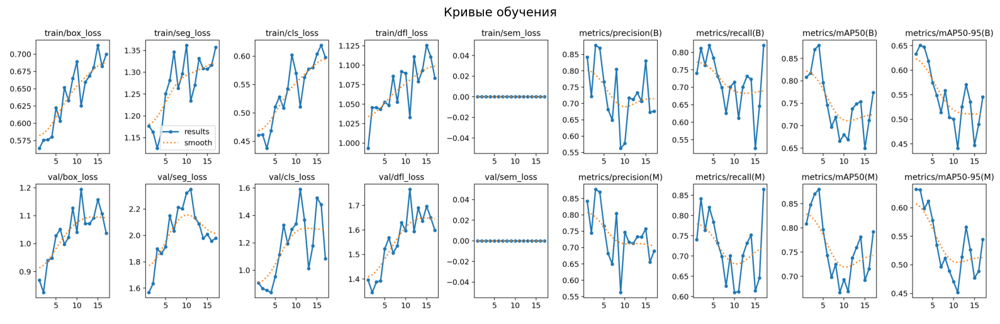

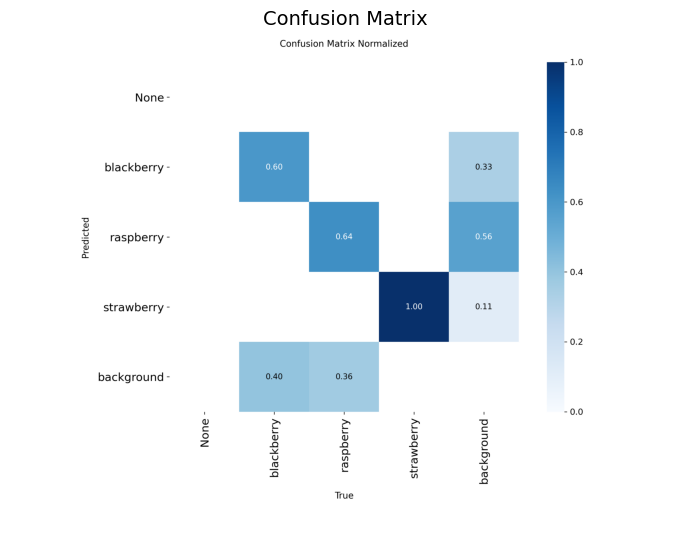

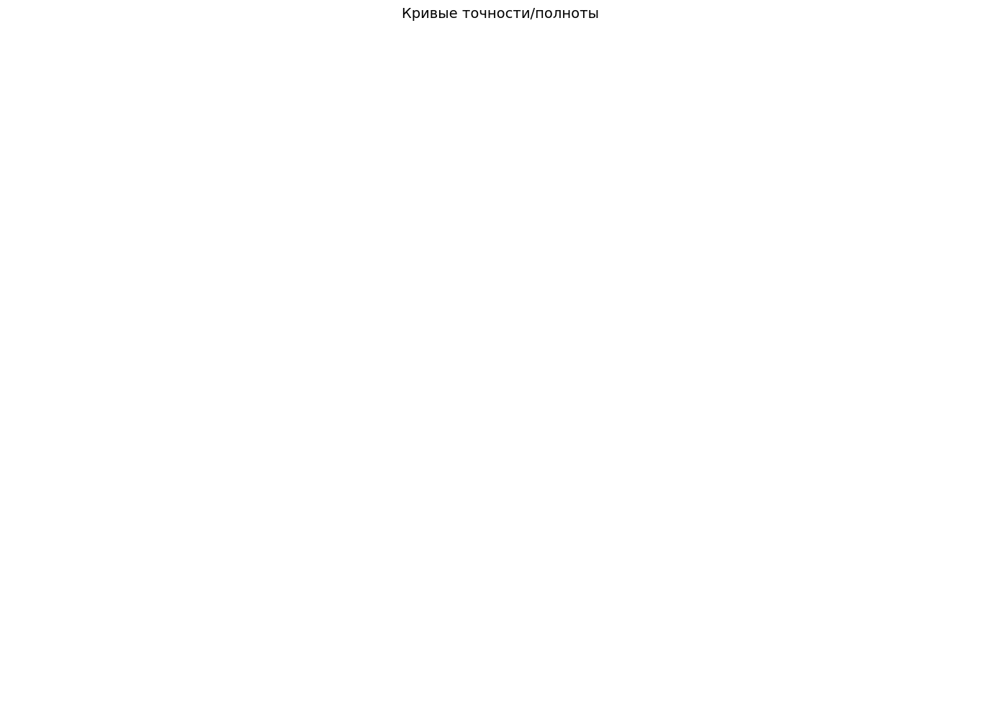

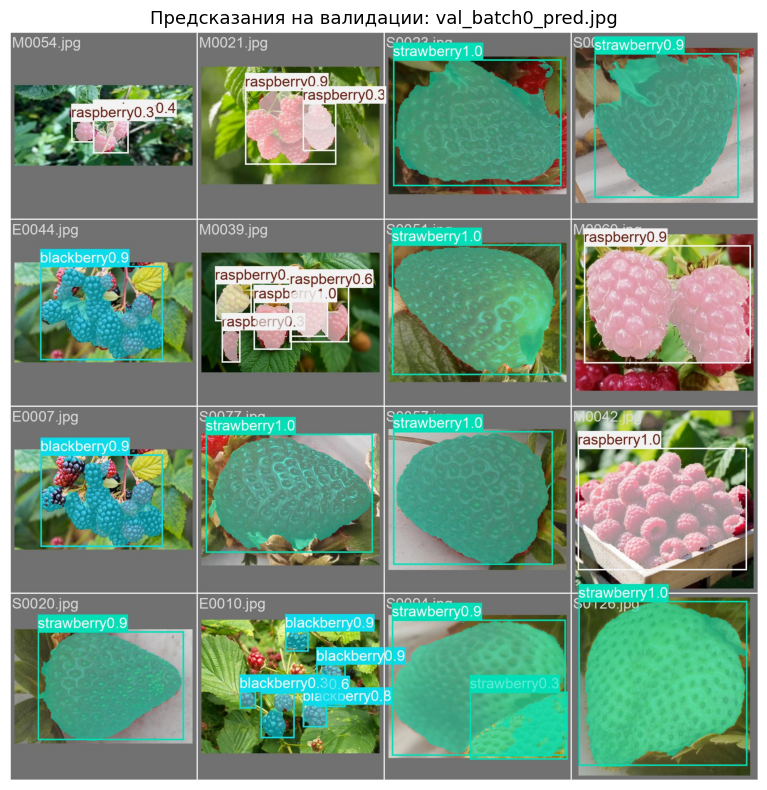


📊 Итоговые метрики (val):
  mAP50:    0.7344
  mAP50-95: 0.5427
  Precision:0.7386
  Recall:   0.6510


In [24]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Папка с результатами обучения
train_dir = model4.trainer.save_dir  # берём автоматически из последнего запуска
# или укажи вручную: train_dir = 'runs/segment/train'

print(f"Результаты сохранены в: {train_dir}")

# --- 1. Кривые обучения (loss + метрики по эпохам) ---
results_png = os.path.join(train_dir, 'results.png')
if os.path.exists(results_png):
    plt.figure(figsize=(16, 8))
    plt.imshow(mpimg.imread(results_png))
    plt.axis('off')
    plt.title('Кривые обучения', fontsize=14)
    plt.tight_layout()
    plt.show()

# --- 2. Матрица ошибок ---
for cm_file in ['confusion_matrix_normalized.png', 'confusion_matrix.png']:
    cm_path = os.path.join(train_dir, cm_file)
    if os.path.exists(cm_path):
        plt.figure(figsize=(7, 6))
        plt.imshow(mpimg.imread(cm_path))
        plt.axis('off')
        plt.title('Confusion Matrix', fontsize=14)
        plt.tight_layout()
        plt.show()
        break

# --- 3. PR / F1 / P / R кривые ---
curves = {
    'PR Curve': 'PR_curve.png',
    'F1 Curve': 'F1_curve.png',
    'Precision Curve': 'P_curve.png',
    'Recall Curve': 'R_curve.png',
}
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
for ax, (title, fname) in zip(axes.flatten(), curves.items()):
    fpath = os.path.join(train_dir, fname)
    if os.path.exists(fpath):
        ax.imshow(mpimg.imread(fpath))
        ax.set_title(title, fontsize=12)
    ax.axis('off')
plt.suptitle('Кривые точности/полноты', fontsize=14)
plt.tight_layout()
plt.show()

# --- 4. Примеры предсказаний на валидации ---
for fname in ['val_batch0_pred.jpg', 'val_batch1_pred.jpg']:
    fpath = os.path.join(train_dir, fname)
    if os.path.exists(fpath):
        plt.figure(figsize=(14, 8))
        plt.imshow(mpimg.imread(fpath))
        plt.axis('off')
        plt.title(f'Предсказания на валидации: {fname}', fontsize=13)
        plt.tight_layout()
        plt.show()

# --- 5. Итоговые метрики числами ---
metrics = model1.trainer.metrics  # или model1.val() если хочешь пересчитать
print("\n📊 Итоговые метрики (val):")
print(f"  mAP50:    {metrics.get('metrics/mAP50(M)', 'N/A'):.4f}")
print(f"  mAP50-95: {metrics.get('metrics/mAP50-95(M)', 'N/A'):.4f}")
print(f"  Precision:{metrics.get('metrics/precision(M)', 'N/A'):.4f}")
print(f"  Recall:   {metrics.get('metrics/recall(M)', 'N/A'):.4f}")

# **4. Экспорт модели в onnx**
# **4.将模型导出到 onnx**

In [25]:
!pip install ultralytics onnx onnx-simplifier onnxruntime

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.6/17.6 MB 58.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 56.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 91.4 MB/s eta 0:00:00
  Created wheel for onnx-simplifier: filename=onnx_simplifier-0.5.0-py3-none-any.whl size=1021 sha256=69fda82e4228a835746eac604de20179b74dba665ea70462470b01ce74f56b7a
  Stored in directory: /root/.cache/pip/wheels/f0/61/52/656a88deb2107e0239543f2bdfab560c47fcf74c3d29765c5e
Successfully built onnx-simplifier


In [26]:
from ultralytics import YOLO

# Load a YOLO-seg model
model = YOLO('/content/gdrive/MyDrive/runs/segment/train_v4/weights/best.pt')

# Export to ONNX
onnx_file = model.export(format='onnx')

# Load an ONNX model
onnx_model = YOLO(onnx_file)

# Run inference on CPU and GPU with ONNXRuntime
# results = onnx_model('dataset/images/test/airplane(19).jpg')

Ultralytics 8.4.53 🚀 Python-3.12.13 torch-2.10.0+cu128 CPU (Intel Xeon CPU @ 2.00GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/
YOLOv8s-seg summary (fused): 86 layers, 11,781,148 parameters, 0 gradients, 39.9 GFLOPs

PyTorch: starting from '/content/gdrive/MyDrive/runs/segment/train_v4/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) ((1, 40, 8400), (1, 32, 160, 160)) (22.7 MB)
requirements: Ultralytics requirements ['onnxslim>=0.1.71', 'onnxruntime-gpu'] not found, attempting AutoUpdate...
Using Python 3.12.13 environment at: /usr
Resolved 12 packages in 681ms
Prepared 3 packages in 30.03s
Installed 3 packages in 36ms
 + colorama==0.4.6
 + onnxruntime-gpu==1.26.0
 + onnxslim==0.1.94

requirements: AutoUpdate success ✅ 31.6s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.21.0 opset 20...


FileNotFoundError: dataset/images/test/airplane(19).jpg does not exist

In [27]:
results = onnx_model('/content/gdrive/MyDrive/ds/images/default/images/test/E0001.jpg')


image 1/1 /content/gdrive/MyDrive/ds/images/default/images/test/E0001.jpg: 640x640 3 blackberrys, 2 raspberrys, 37.4ms
Speed: 24.3ms preprocess, 37.4ms inference, 89.0ms postprocess per image at shape (1, 3, 640, 640)


In [28]:
print(results)

[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'None', 1: 'blackberry', 2: 'raspberry', 3: 'strawberry'}
obb: None
orig_img: array([[[118, 182, 122],
        [117, 182, 120],
        [115, 180, 118],
        ...,
        [ 97, 141,  82],
        [ 78, 124,  65],
        [ 78, 124,  65]],

       [[120, 182, 122],
        [118, 182, 122],
        [119, 182, 120],
        ...,
        [101, 145,  86],
        [ 85, 129,  70],
        [ 83, 129,  70]],

       [[117, 176, 118],
        [117, 179, 119],
        [121, 181, 121],
        ...,
        [109, 150,  92],
        [ 96, 137,  79],
        [ 94, 138,  79]],

       ...,

       [[ 73, 122,  68],
        [ 73, 122,  68],
        [ 73, 123,  69],
        ...,
        [170, 201, 138],
        [171, 202, 139],
        [171, 202, 139]],

       [[ 74, 123,  69],
        [ 74, 123,  69],
        [ 73, 123